In [1]:
import cv2
import glob
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO
import numpy as np
from tracker import Tracker

# ===== 경로 설정 =====
SEQ_DIR = "/home/jinjinjara1022/AutonomousDriving/datasets/KITTI_Tracking/training/image_02/0000"
img_files = sorted(glob.glob(os.path.join(SEQ_DIR, "*.png")))

# ===== YOLOv8 모델 (COCO pretrained) =====
model = YOLO("yolov8n.pt")  # n 모델이 가볍고 빠름
classes = [0, 2]  # COCO: 0=person, 2=car


# 시각화 함수 (bbox + ID)
def draw_tracked(img, tracked):
    img_vis = img.copy()
    for row in tracked:
        x1, y1, x2, y2, tid = row
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
        tid = int(tid)

        # 바운딩 박스
        cv2.rectangle(img_vis, (x1, y1), (x2, y2), (0,255,0), 2)

        # ID 텍스트
        cv2.putText(img_vis, f"ID {tid}", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

    return img_vis


# 프레임 처리 함수
def show_frame(frame_idx):
    img_bgr = cv2.imread(img_files[frame_idx])
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Detection
    dets = model.predict(img_rgb, classes=classes, conf=0.2, verbose=False)[0].boxes.xyxy.cpu().numpy()

    # Tracking 업데이트
    tracked = tracker.update(dets)

    # 출력 로그
    print(f"=== Frame {frame_idx} ===")
    print("Detections:", dets.shape[0])
    print("Tracked outputs:")
    for row in tracked:
        x1, y1, x2, y2, tid = row
        print(f"  ID {int(tid)}: ({x1:.1f}, {y1:.1f}, {x2:.1f}, {y2:.1f})")

    # 시각화
    img_vis = draw_tracked(img_rgb, tracked)
    plt.figure(figsize=(12,6))
    plt.imshow(img_vis)
    plt.title(f"KITTI Frame {frame_idx} - YOLOv8 + Tracker")
    plt.axis("off")
    plt.show()

=== Frame 0 ===
Detections: 5
Tracked outputs:
  ID 0: (776.2, 170.3, 882.5, 364.8)
  ID 1: (1110.9, 172.7, 1196.8, 315.1)
  ID 2: (299.7, 169.1, 452.5, 284.3)
  ID 3: (677.1, 192.3, 778.2, 233.8)
  ID 4: (676.9, 192.9, 745.4, 231.3)


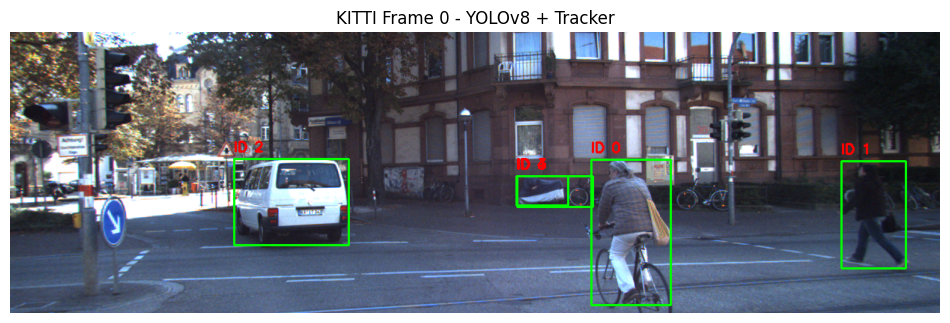

=== Frame 1 ===
Detections: 3
Tracked outputs:
  ID 0: (780.0, 167.4, 883.3, 355.5)
  ID 1: (1141.2, 170.4, 1219.7, 309.5)
  ID 2: (298.1, 165.1, 448.6, 280.3)


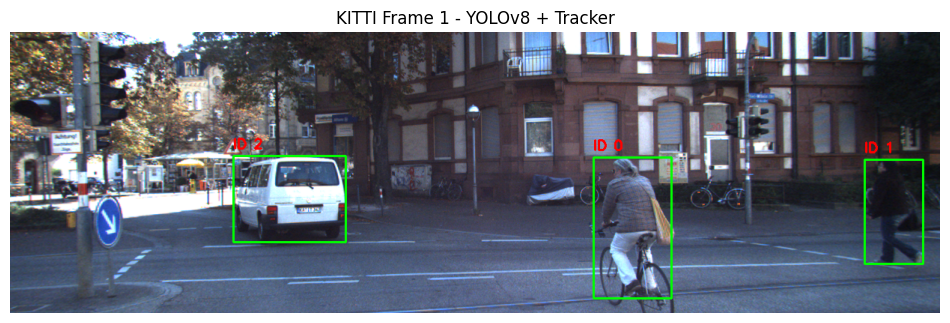

=== Frame 2 ===
Detections: 3
Tracked outputs:
  ID 0: (787.5, 158.9, 889.3, 344.9)
  ID 1: (1165.1, 164.0, 1240.8, 306.3)
  ID 2: (298.3, 159.5, 444.8, 272.0)


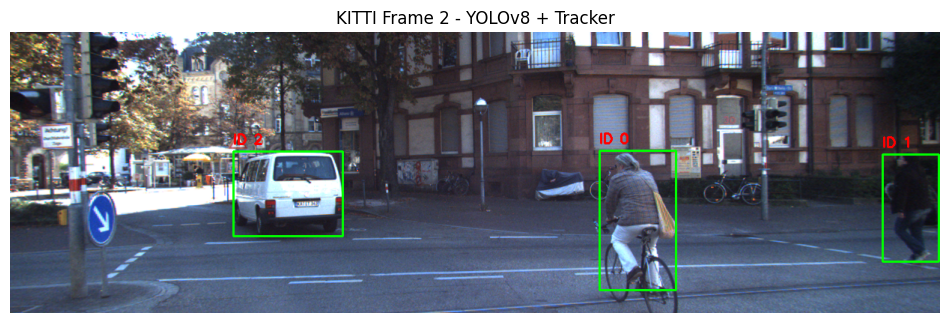

=== Frame 3 ===
Detections: 2
Tracked outputs:
  ID 0: (792.4, 155.0, 895.6, 341.8)
  ID 1: (1189.3, 166.9, 1249.8, 298.9)


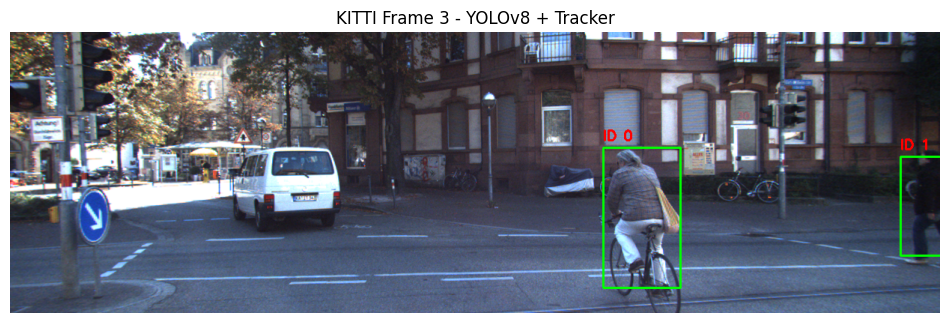

=== Frame 4 ===
Detections: 6
Tracked outputs:
  ID 0: (797.4, 155.4, 901.1, 343.8)
  ID 1: (1204.9, 192.4, 1250.0, 301.8)
  ID 2: (294.7, 152.2, 439.0, 262.7)
  ID 5: (0.0, 184.9, 48.3, 213.2)
  ID 6: (7.8, 185.8, 56.1, 211.4)
  ID 7: (0.0, 185.8, 55.0, 230.0)


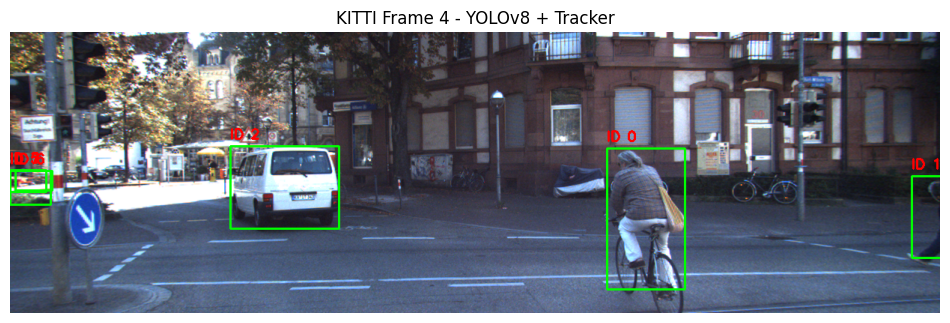

=== Frame 5 ===
Detections: 2
Tracked outputs:
  ID 0: (800.4, 157.2, 902.4, 344.5)
  ID 8: (736.8, 177.0, 809.6, 225.3)


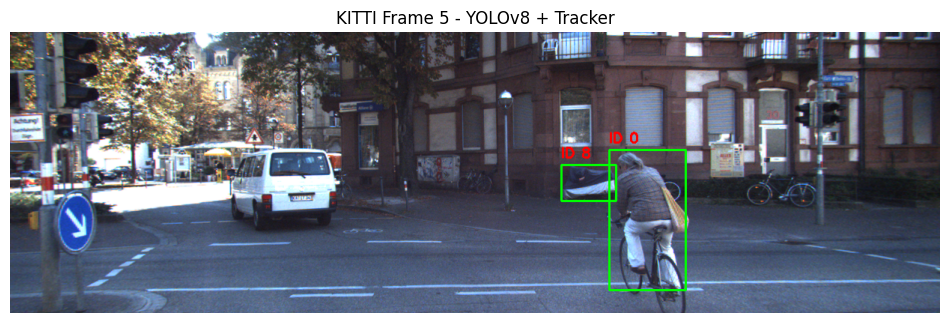

=== Frame 6 ===
Detections: 3
Tracked outputs:
  ID 0: (805.1, 156.8, 907.7, 343.9)
  ID 2: (293.5, 153.9, 433.5, 261.2)
  ID 9: (422.5, 163.5, 453.8, 214.0)


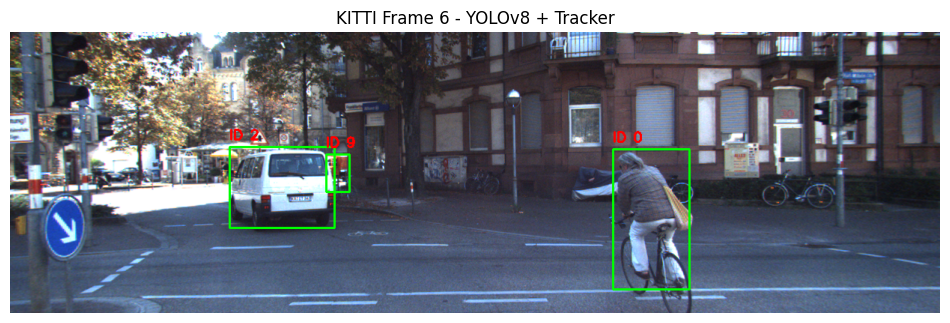

=== Frame 7 ===
Detections: 4
Tracked outputs:
  ID 0: (808.6, 157.6, 913.1, 343.8)
  ID 2: (292.1, 155.3, 431.0, 261.9)
  ID 9: (421.1, 164.5, 457.5, 214.2)
  ID 10: (762.3, 158.5, 916.9, 344.1)


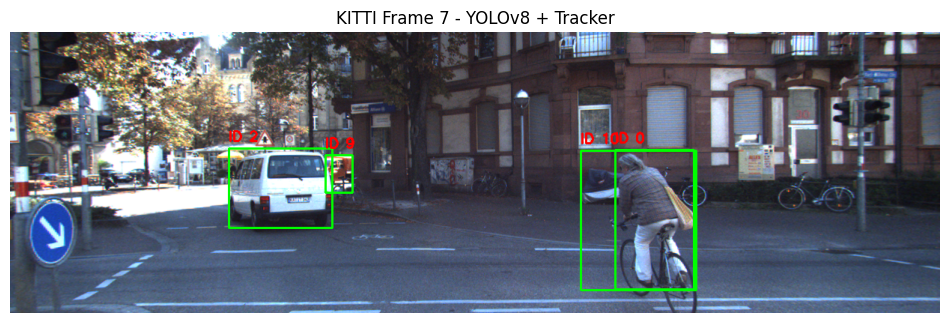

=== Frame 8 ===
Detections: 4
Tracked outputs:
  ID 0: (809.0, 159.8, 916.0, 345.6)
  ID 2: (289.9, 157.3, 426.8, 263.0)
  ID 9: (420.9, 163.6, 465.6, 216.3)
  ID 11: (418.0, 170.2, 453.6, 215.0)


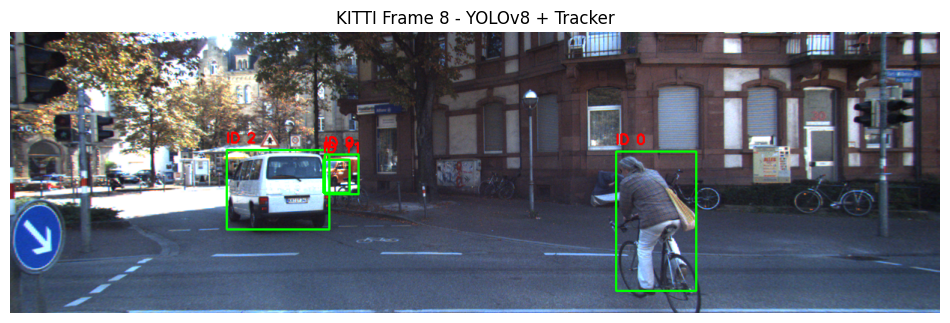

=== Frame 9 ===
Detections: 3
Tracked outputs:
  ID 0: (810.2, 161.8, 918.6, 349.2)
  ID 2: (288.1, 156.0, 423.5, 261.7)
  ID 9: (421.8, 163.4, 472.0, 212.6)


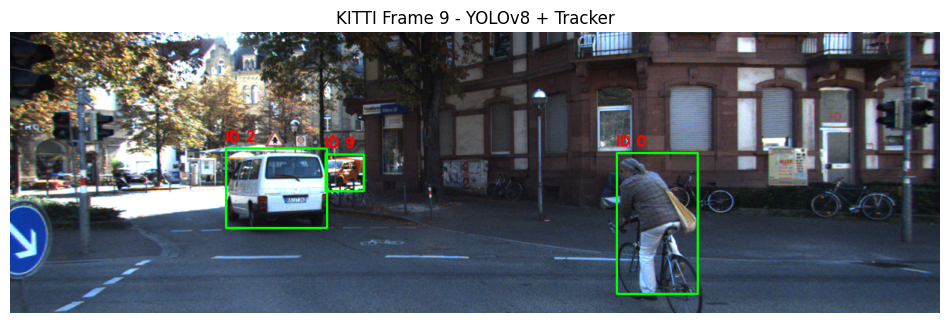

=== Frame 10 ===
Detections: 3
Tracked outputs:
  ID 0: (805.9, 166.4, 917.3, 355.1)
  ID 9: (426.9, 165.9, 478.7, 212.0)
  ID 11: (424.0, 167.8, 480.0, 225.1)


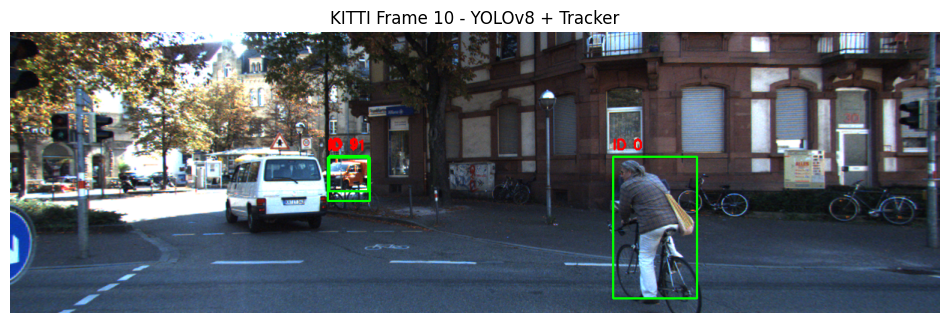

=== Frame 11 ===
Detections: 4
Tracked outputs:
  ID 0: (802.6, 169.0, 909.9, 358.2)
  ID 2: (287.1, 161.5, 422.0, 265.5)
  ID 9: (433.3, 168.9, 487.0, 211.9)
  ID 11: (444.8, 168.7, 492.2, 214.7)


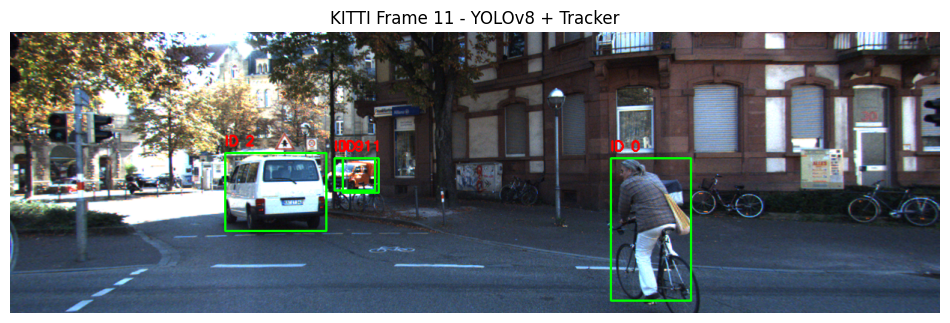

=== Frame 12 ===
Detections: 2
Tracked outputs:
  ID 0: (799.0, 166.2, 908.4, 356.1)
  ID 9: (443.8, 168.6, 495.2, 209.3)


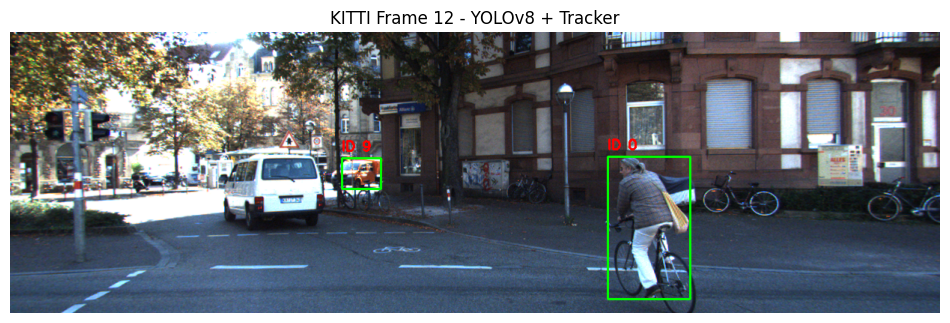

=== Frame 13 ===
Detections: 3
Tracked outputs:
  ID 0: (797.2, 163.2, 906.2, 348.9)
  ID 2: (283.5, 157.4, 419.2, 261.1)
  ID 9: (448.3, 166.5, 503.2, 208.7)


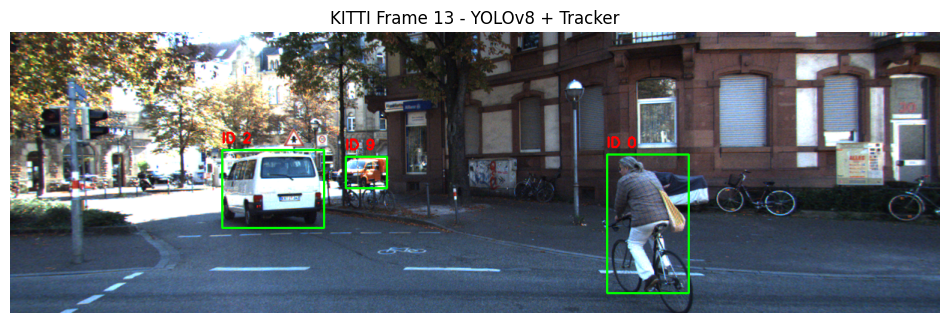

=== Frame 14 ===
Detections: 2
Tracked outputs:
  ID 0: (796.5, 161.6, 902.5, 341.9)
  ID 9: (455.7, 166.4, 512.0, 209.7)


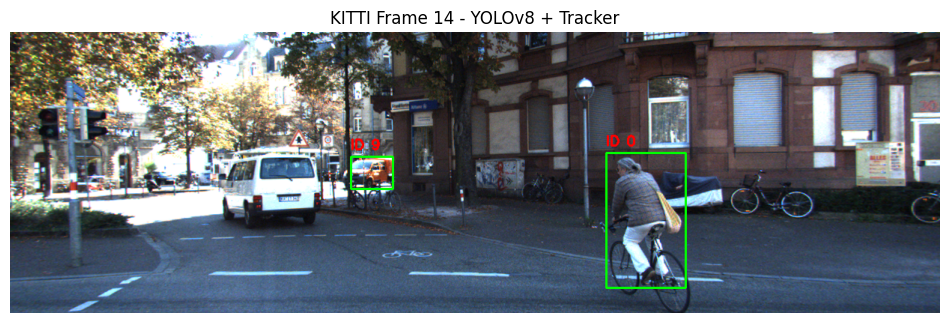

=== Frame 15 ===
Detections: 3
Tracked outputs:
  ID 0: (790.5, 164.8, 895.5, 341.3)
  ID 9: (463.6, 166.4, 520.2, 210.7)
  ID 12: (106.5, 200.5, 153.8, 221.6)


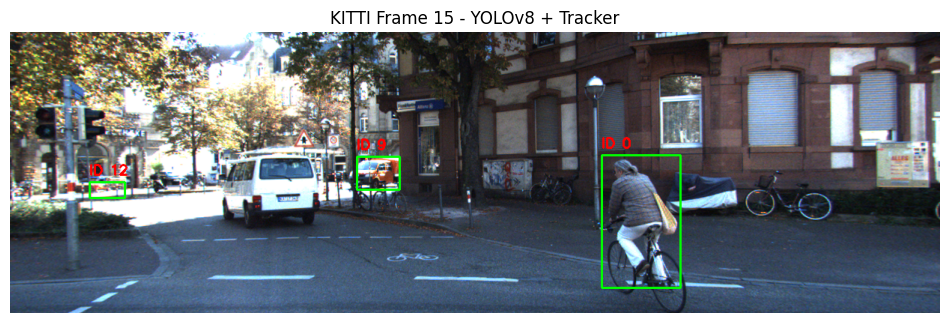

=== Frame 16 ===
Detections: 3
Tracked outputs:
  ID 0: (784.4, 164.3, 888.8, 337.6)
  ID 2: (281.7, 154.5, 412.7, 256.7)
  ID 9: (468.6, 164.1, 527.3, 208.0)


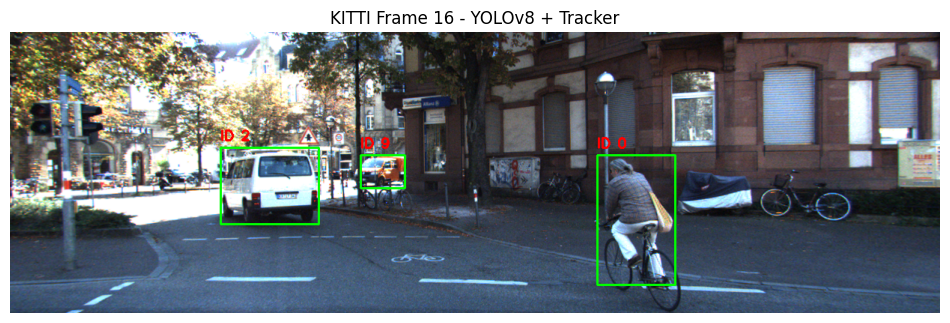

=== Frame 17 ===
Detections: 2
Tracked outputs:
  ID 0: (783.3, 168.7, 885.1, 338.7)
  ID 9: (476.2, 165.2, 535.8, 208.8)


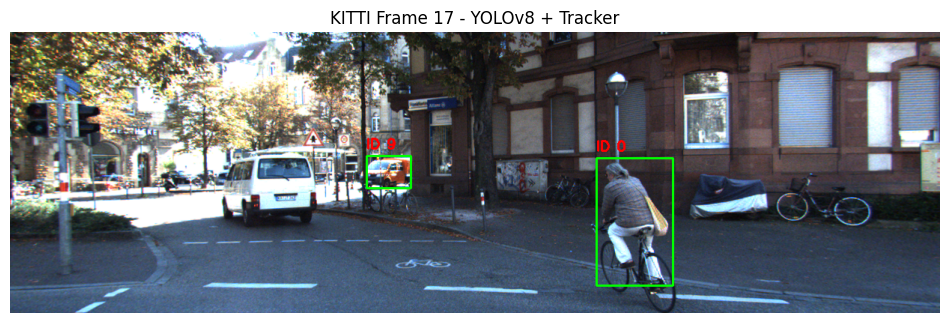

=== Frame 18 ===
Detections: 3
Tracked outputs:
  ID 0: (780.7, 174.7, 878.8, 343.5)
  ID 9: (481.9, 170.2, 543.2, 214.3)
  ID 13: (479.3, 173.3, 545.4, 238.5)


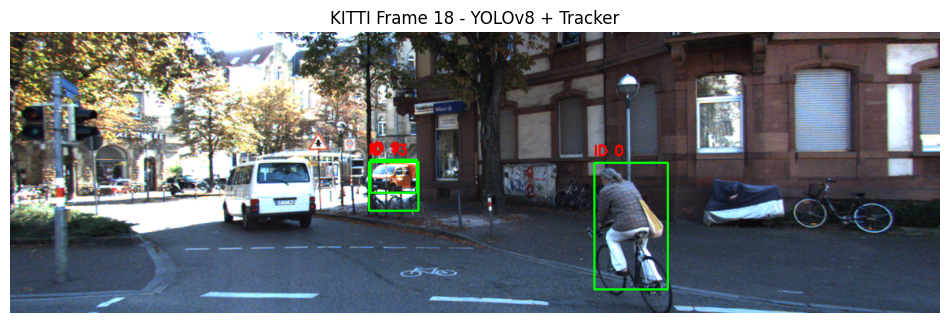

=== Frame 19 ===
Detections: 4
Tracked outputs:
  ID 0: (772.9, 179.8, 869.1, 346.1)
  ID 9: (489.3, 175.8, 551.5, 219.5)
  ID 13: (485.2, 179.8, 553.0, 249.9)
  ID 14: (140.7, 204.4, 178.6, 225.5)


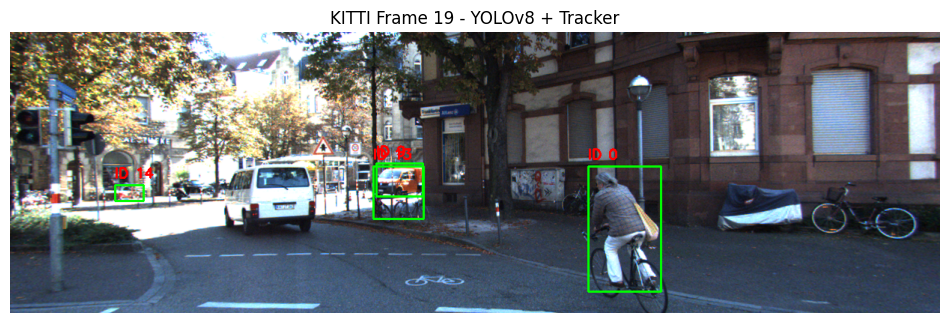

In [2]:
# ===== Tracker 초기화 =====
tracker = Tracker(max_age=2, min_hits=1, iou_threshold=0.3)

for idx in range(20):
    show_frame(idx)  # 첫 10 프레임만 시각화